# Cluster the datasets to get first level annotation

In this script, we aim to create level-1 annotations for downstream analysis. The level-1 annotations should align with the coarse annotations we performed earlier and distinguish the basic cell types, such as mesenchyme and epithelium

## Set environment

In [2]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [14]:
%config InlineBackend.figure_format = 'retina'  # For high-resolution displays
%config InlineBackend.print_figure_kwargs = {'dpi': 200}  # Set DPI

In [20]:
global_seed = 123
min_cells_valid = 50

In [3]:
sc.settings.figdir = '../../results/integration/20241024_first_level/'

In [4]:
adata = sc.read("../../processed_data/integrated_data/20241021_filtered_log_count.h5ad")

In [7]:
adata

AnnData object with n_obs × n_vars = 261929 × 36303
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'coarse_anno_1', 'total_counts', 'log10_total_counts', 'n_genes_detected', 'mito_frac', 'ribo_frac', 'compl', 'size_factors', 'Sample', 'Project', 'Core_datasets', 'Mandibular_Maxillary', 'Molar_Incisor', 'Tooth position', 'Histology', 'Sex', 'Gene Type', 'Knockout_gene', 'Cre', 'Treatment', 'FACs', 'Age', 'Stage', 'Development stage', 'Disease', 'Strain', 'Dissociation_enzyme', 'Machine', 'Species', 'Related assay', 'Journal', 'Data Source', 'Data location', 'new_totals_log', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'scDblFinder_class', 'leiden'
    var: 'gene_symbols', 'n_cells', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'means', 'dispe

In [31]:
adata.obs["coarse_anno_1"][adata.obs["coarse_anno_1"] == "perivascular"] = "Perivascular"
adata.obs["coarse_anno_1"][adata.obs["coarse_anno_1"] == "cementoblasts"] = "Mesenchyme"
adata.obs["coarse_anno_1"][adata.obs["coarse_anno_1"] == "neuron"] = "Neuron"

In [33]:
# Assuming adata.obs["coarse_anno_1"] is a pandas Series with categorical data
# First, get the value counts
value_counts = adata.obs["coarse_anno_1"].value_counts()

# Filter categories with counts > 0
valid_categories = value_counts[value_counts > 0].index

# Reassign the categories in the original Series
adata.obs["coarse_anno_1"] = adata.obs["coarse_anno_1"].cat.remove_categories(
    adata.obs["coarse_anno_1"].cat.categories.difference(valid_categories)
)

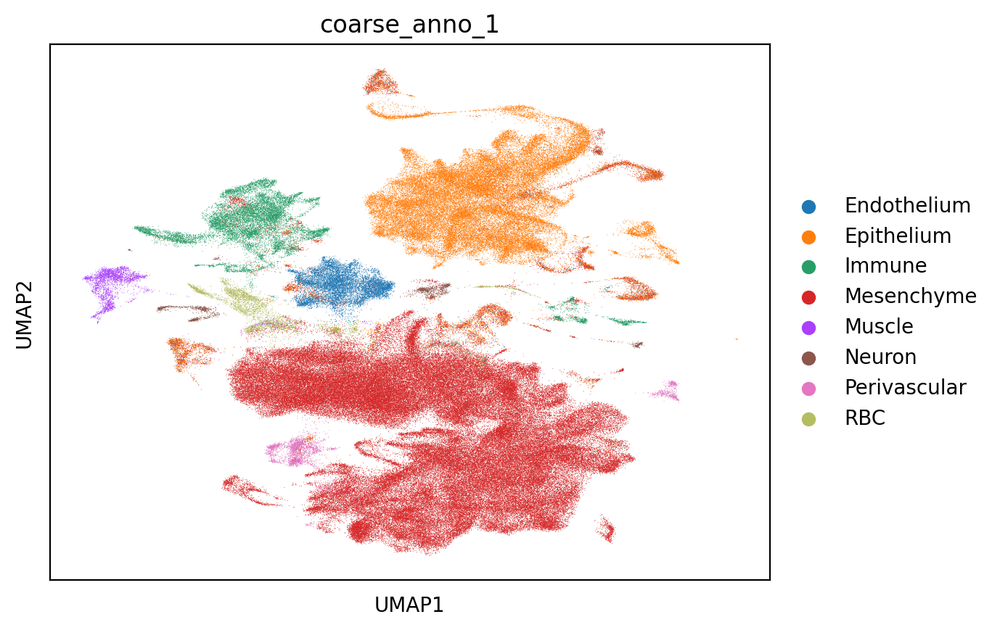

In [34]:
sc.pl.umap(adata,color="coarse_anno_1")

## Leiden Cluster

We gradually increased the resolution, to find the optimal resolution that can serves as the first level annotation.

In [21]:
resolutions = [0.001,0.005,0.01,0.05,0.1,0.175,0.25,0.5,0.75,1]
for res in resolutions:
        key_name = "leiden_clusters_"+str(res)
        sc.tl.leiden(adata,resolution=res,key_added=key_name,random_state=global_seed,neighbors_key='neighbors') # could use neighbors_key
        value_counts = adata.obs[key_name].value_counts()
        print(" Ran leiden with resolution "+str(res)+" and found "+str(len(set(adata.obs[key_name])))+" total clusters with "+str(len(value_counts[value_counts > min_cells_valid]))+" valid clusters")


 Ran leiden with resolution 0.001 and found 2 total clusters with 1 valid clusters
 Ran leiden with resolution 0.005 and found 3 total clusters with 2 valid clusters
 Ran leiden with resolution 0.01 and found 6 total clusters with 5 valid clusters
 Ran leiden with resolution 0.05 and found 11 total clusters with 10 valid clusters
 Ran leiden with resolution 0.1 and found 14 total clusters with 13 valid clusters
 Ran leiden with resolution 0.175 and found 20 total clusters with 18 valid clusters
 Ran leiden with resolution 0.25 and found 22 total clusters with 21 valid clusters
 Ran leiden with resolution 0.5 and found 33 total clusters with 31 valid clusters
 Ran leiden with resolution 0.75 and found 41 total clusters with 39 valid clusters
 Ran leiden with resolution 1 and found 43 total clusters with 41 valid clusters


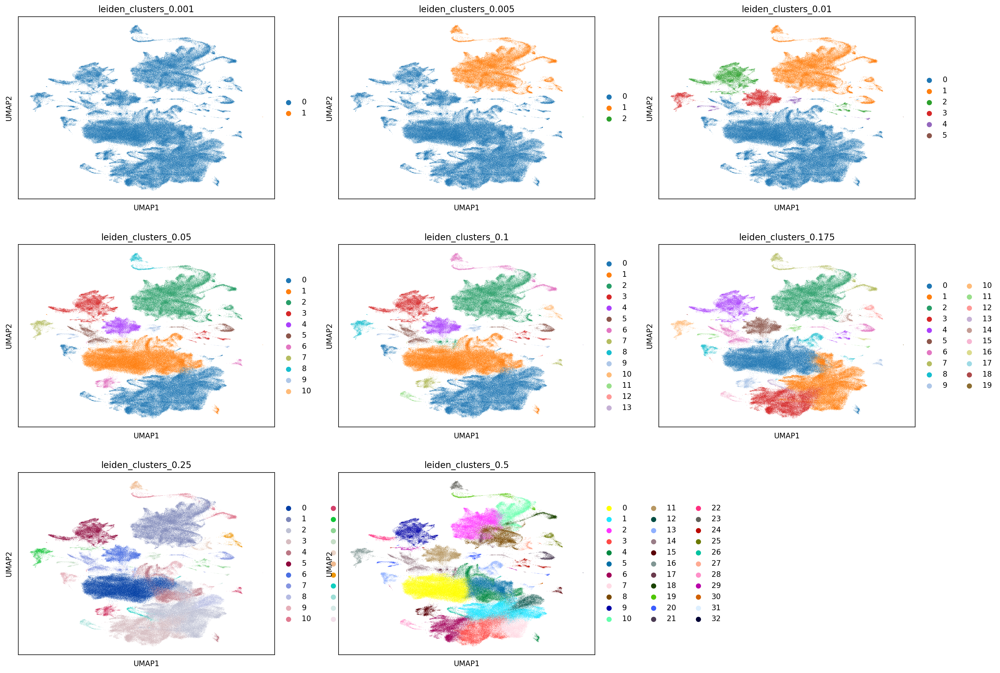

In [35]:
sc.pl.umap(adata,color=['leiden_clusters_0.001', 'leiden_clusters_0.005', 'leiden_clusters_0.01', 
                        'leiden_clusters_0.05', 'leiden_clusters_0.1', 'leiden_clusters_0.175', 
                        'leiden_clusters_0.25', 'leiden_clusters_0.5'],ncols=3,save = "_diff_cluster.png")

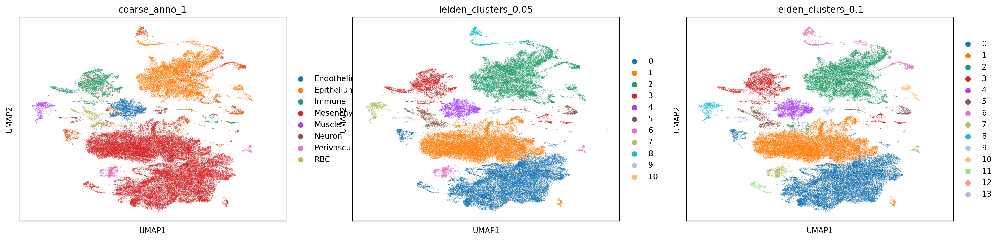

In [36]:
sc.pl.umap(adata,color=['coarse_anno_1', 
                        'leiden_clusters_0.05', 'leiden_clusters_0.1'],ncols=3,save = "_cluster_compare.png")

After comparison, we used `resolution:0.05` to serves as first-level annotation.

In [37]:
adata.obs["anno_level_1"] = adata.obs["leiden_clusters_0.05"].map(
    {
        "0": "Mesenchyme",
        "1": "Mesenchyme",
        "2": "Epithelium",
        "3": "Immune",
        "4": "Endothelium",
        "5": "RBC",
        "6": "Perivascular",
        "7": "Muscle",
        "8": "Epithelium",
        "9": "Neuron",
        "10": "Epithelium"
    }
)

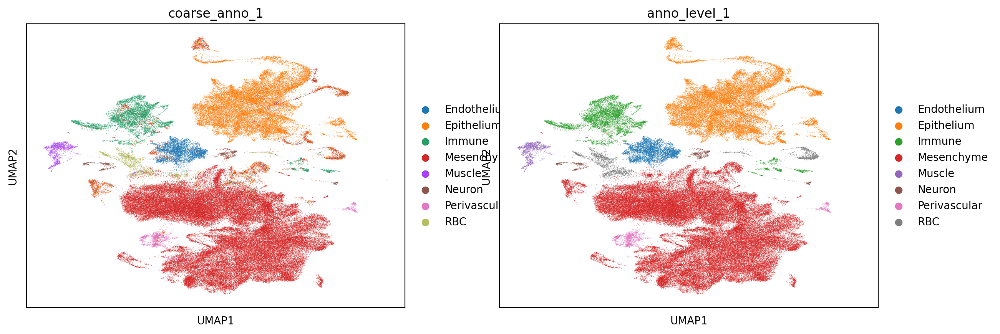

In [38]:
sc.pl.umap(adata,color=['coarse_anno_1','anno_level_1'],save = "_cluster_rename.png")

In [40]:
meta_subset = adata.obs.filter(regex=("leiden_clusters_"))

In [44]:
saved_column = ["coarse_anno_1",'anno_level_1']
meta_subset2 = adata.obs[saved_column]

In [47]:
meta2save = pd.concat([meta_subset,meta_subset2],axis=1)
meta2save.to_csv("../../processed_data/metadata/20241024_metadata_26w_clustered.csv")

## Validation

We ultilized marker genes of every cluster to validate our annotation results.

In [58]:
markerGene = pd.read_csv("../../data/annotation/coarse_marker_gene.csv")

In [59]:
markerGene

,Cell_type,Gene
0,Mesenchyme,Sox9
1,Mesenchyme,Vcan
2,Mesenchyme,Msx2
3,Epithelium,Krt14
4,Epithelium,Pitx2
5,Endothelium,Cdh5
6,Immune,C1qa
7,Immune,Napsa
8,Muscle,Myog
9,Neuron,Sox10


In [60]:
genes = markerGene["Gene"]

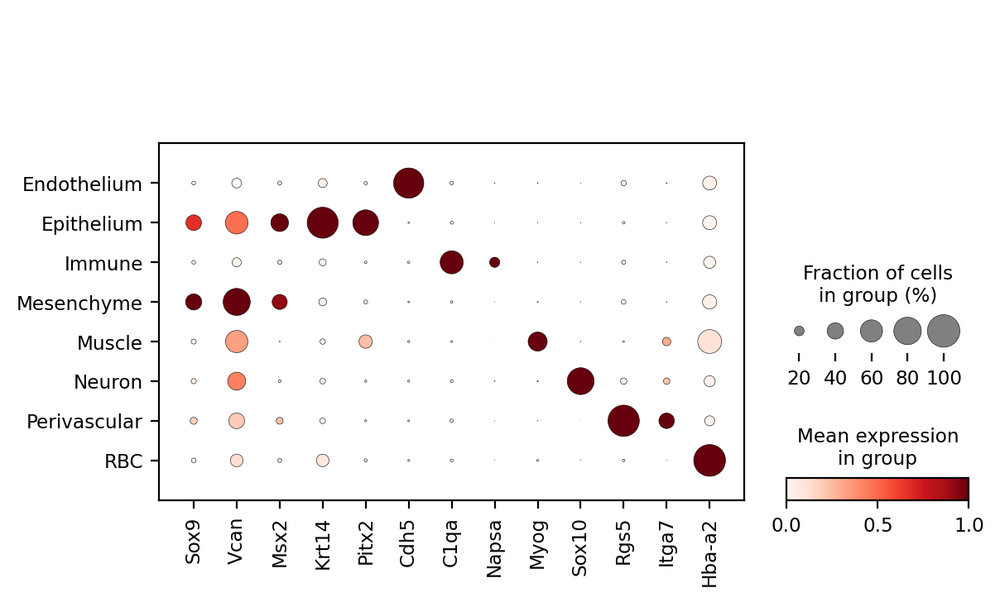

In [62]:
sc.pl.dotplot(adata, genes, groupby="anno_level_1", standard_scale="var",save="_marker_plot.pdf")

As we can see, the marker genes are highly correlated with the cell types, which confirms that our annotation results are accurate

## Save data

In [66]:
mesenchyme = adata[adata.obs["anno_level_1"] == "Mesenchyme"].copy()
epithelium = adata[adata.obs["anno_level_1"] == "Epithelium"].copy()

In [68]:
adata.write_h5ad("../../processed_data/integrated_data/20241021_filtered_log_count.h5ad")
mesenchyme.write_h5ad("../../processed_data/integrated_data/20241024_mesenchyme.h5ad")
epithelium.write_h5ad("../../processed_data/integrated_data/20241024_epithelium.h5ad")